<a href="https://colab.research.google.com/github/View490/MOTOR_JAPAN/blob/main/ObjectDetection_YOLO_Pills.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Download dataset

## Create folder for dataset

In [1]:
import os
HOME = os.getcwd()
try:
    os.mkdir('datasets')
except FileExistsError as file_exist_error:
    print("Cannot create a file when folder 'datasets' already exists")

In [2]:
# Change current directory to dataset
%cd {HOME}/datasets

/content/datasets


## Downloading dataset

In [3]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="nxl5o1thFPMhTHCXkPOe")
project = rf.workspace("seblful").project("pills-detection-s9ywn")
dataset = project.version(21).download("yolov8")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.3/63.3 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 11.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.2/72.2 kB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5.9 MB/s eta 0:00:00
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      Successfully uninstalled pyparsing-3.1.1
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.8.1.78
    Uninstalling opencv-python-headless-4.8.1.78:
      Successfully uninstalled opencv-python-headless-4.8.1.78
  Attempting uninstall: idna
    Found existing

loading Roboflow workspace...
loading Roboflow project...
[WARNING] we noticed you are downloading a `yolov8` datasets but you don't have `ultralytics` installed. Roboflow `.deploy` supports only models trained with `ultralytics==8.0.196`, to intall it `pip install ultralytics==8.0.196`.



Extracting Dataset Version Zip to Pills-Detection-21 in yolov8:: 100%|██████████| 1404/1404 [00:00<00:00, 5594.59it/s]


In [6]:
# Change current directory to HOME
%cd {HOME}

/content


# Training

## Train with CLI

In [7]:
# What is dataset location?
dataset.location

'/content/datasets/Pills-Detection-21'

In [7]:
#!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=1 imgsz=640 plots=True

/bin/bash: line 1: yolo: command not found


## Train with Python

In [8]:
# Ultralytics check
!pip install ultralytics
import ultralytics

ultralytics.checks()

Ultralytics YOLOv8.0.207 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 27.3/78.2 GB disk)


In [9]:
# PyTorch check
import torch
torch.__version__

'2.1.0+cu118'

In [10]:
# Instantiate device
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Current device is {device}")

Current device is cuda


In [14]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [28]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
2023-11-08 05:20:59.466429: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-08 05:20:59.466512: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-08 05:20:59.466552: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered

NOTE: Using experimental fast data loading logic. To disable, pass
    "--load_fast=false" and report issues on GitHub. More details:
    https://github.com/tensorflow/tensorboard/issues/4784

Address already in use
Port 6006 is in use by another program. Either identify and stop that pr

In [11]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolov8s.yaml")  # build a new model from scratch
model = YOLO("yolov8s.pt")  # load a pretrained model (recommended for training)

# Transform model to GPU
# model.to(device)

# Use the model
model.train(data=dataset.location+'/data.yaml', epochs=2, imgsz=640, batch=8)  # train the model


                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f88537bbfd0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [12]:
metrics = model.val()  # evaluate model performance on the validation set

Ultralytics YOLOv8.0.207 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/datasets/Pills-Detection-21/valid/labels.cache... 135 images, 0 backgrounds, 0 corrupt: 100%|██████████| 135/135 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:11<00:00,  1.43it/s]
                   all        135       2602      0.745      0.752      0.801       0.45
              capsules        135        838      0.633      0.763      0.743      0.431
               tablets        135       1764      0.858      0.741       0.86      0.468
Speed: 0.9ms preprocess, 23.1ms inference, 0.0ms loss, 5.7ms postprocess per image
Results saved to runs/detect/train2


In [21]:
results = model("https://upload.wikimedia.org/wikipedia/commons/f/fe/Prozac_pills.jpg")  # predict on an image
success = model.export(format="onnx")  # export the model to ONNX format


Found https://upload.wikimedia.org/wikipedia/commons/f/fe/Prozac_pills.jpg locally at Prozac_pills.jpg
image 1/1 /content/Prozac_pills.jpg: 480x640 17 capsuless, 13.4ms
Speed: 3.6ms preprocess, 13.4ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 640)
Ultralytics YOLOv8.0.207 🚀 Python-3.10.12 torch-2.1.0+cu118 CPU (Intel Xeon 2.00GHz)

PyTorch: starting from 'runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 6, 8400) (21.5 MB)

ONNX: starting export with onnx 1.15.0 opset 17...
ONNX: export success ✅ 1.2s, saved as 'runs/detect/train/weights/best.onnx' (42.6 MB)

Export complete (3.1s)
Results saved to /content/runs/detect/train/weights
Predict:         yolo predict task=detect model=runs/detect/train/weights/best.onnx imgsz=640  
Validate:        yolo val task=detect model=runs/detect/train/weights/best.onnx imgsz=640 data=/content/datasets/Pills-Detection-21/data.yaml  
Visualize:       https://netron.app


## Results of 1st training

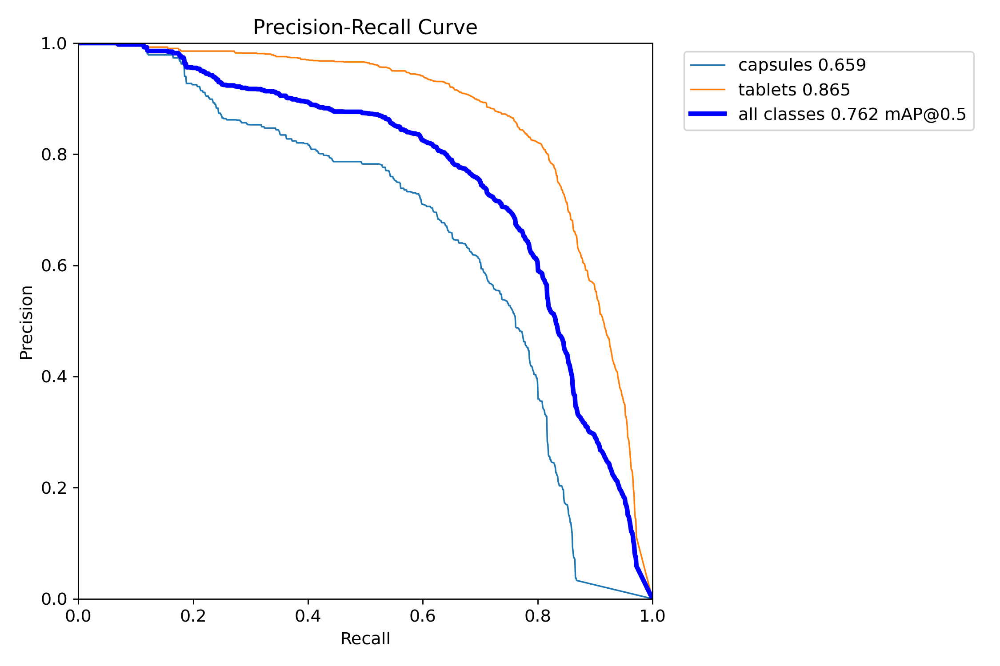

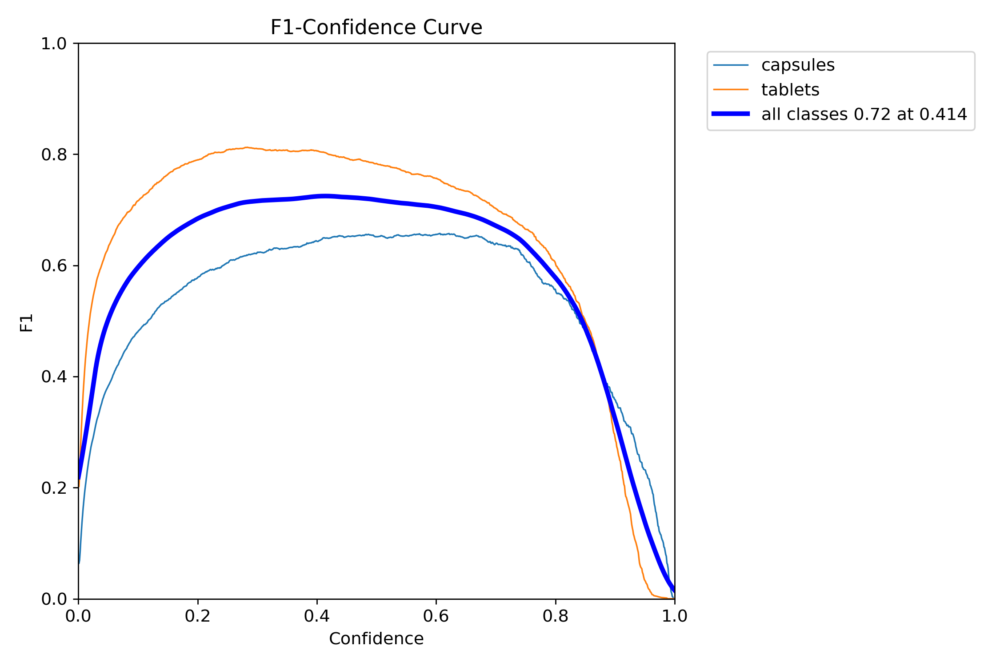

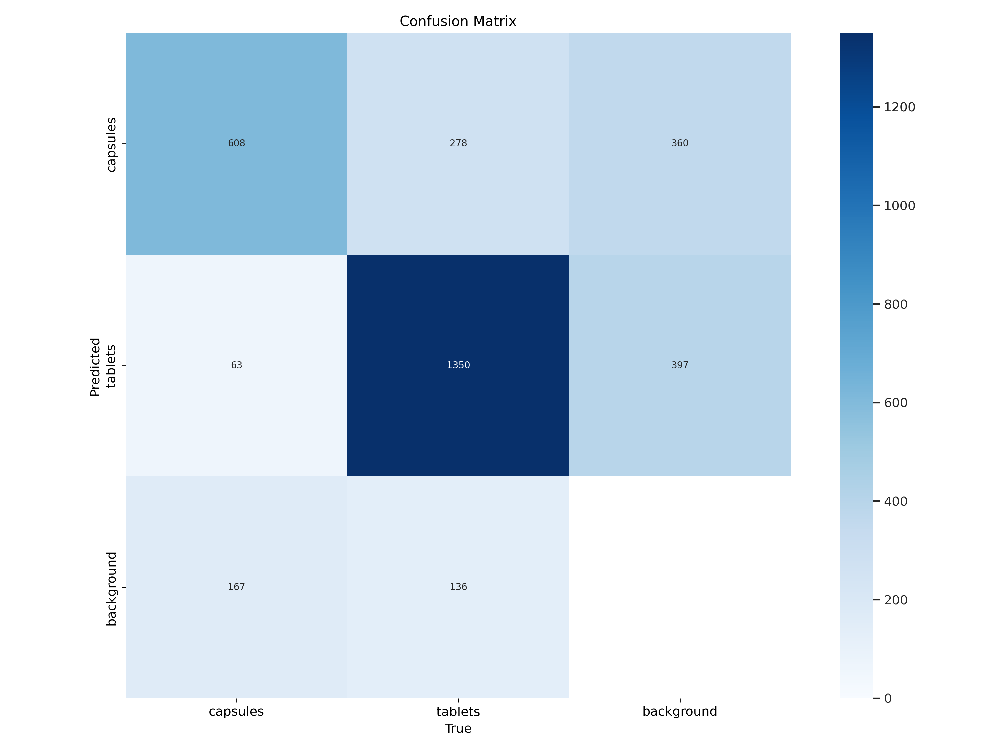

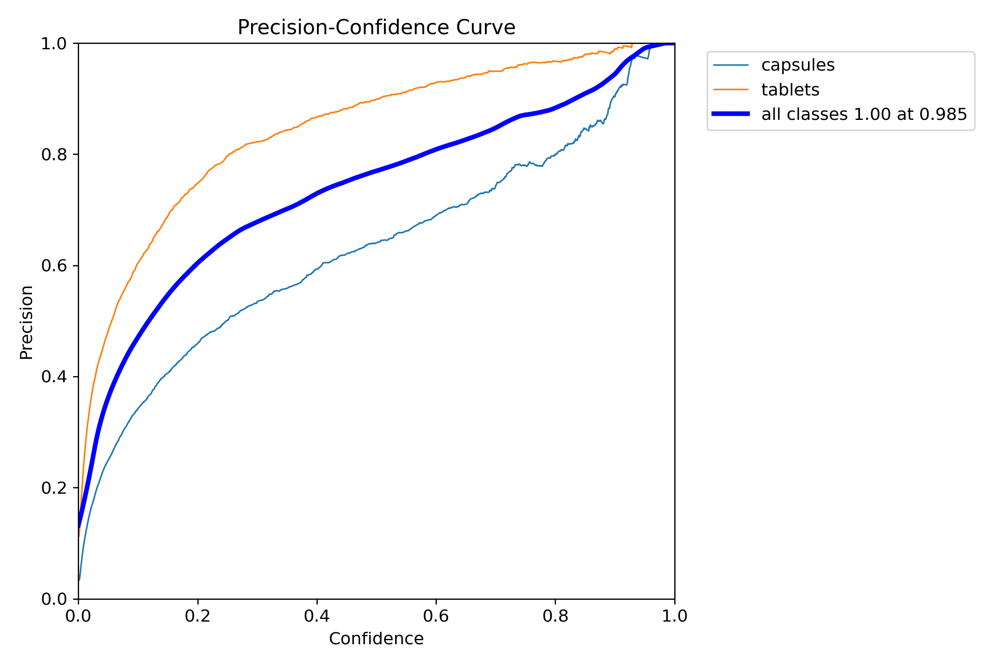

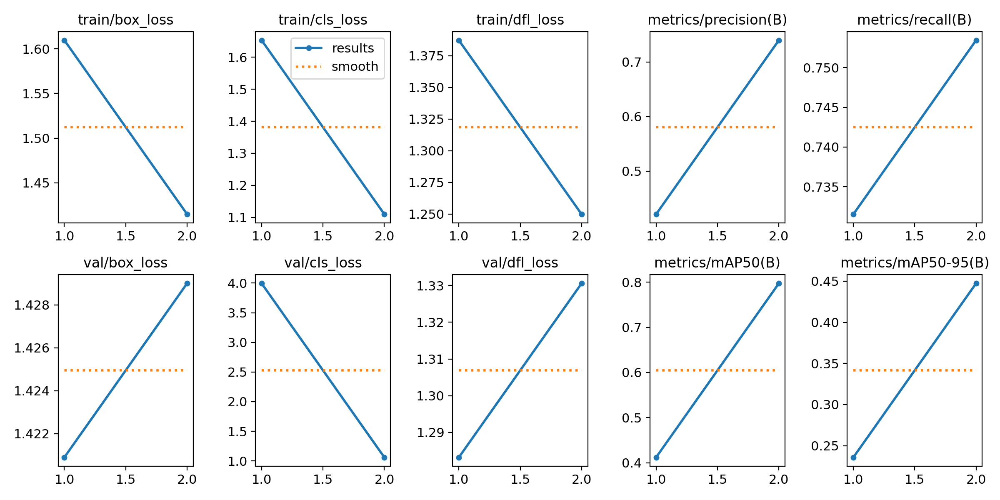

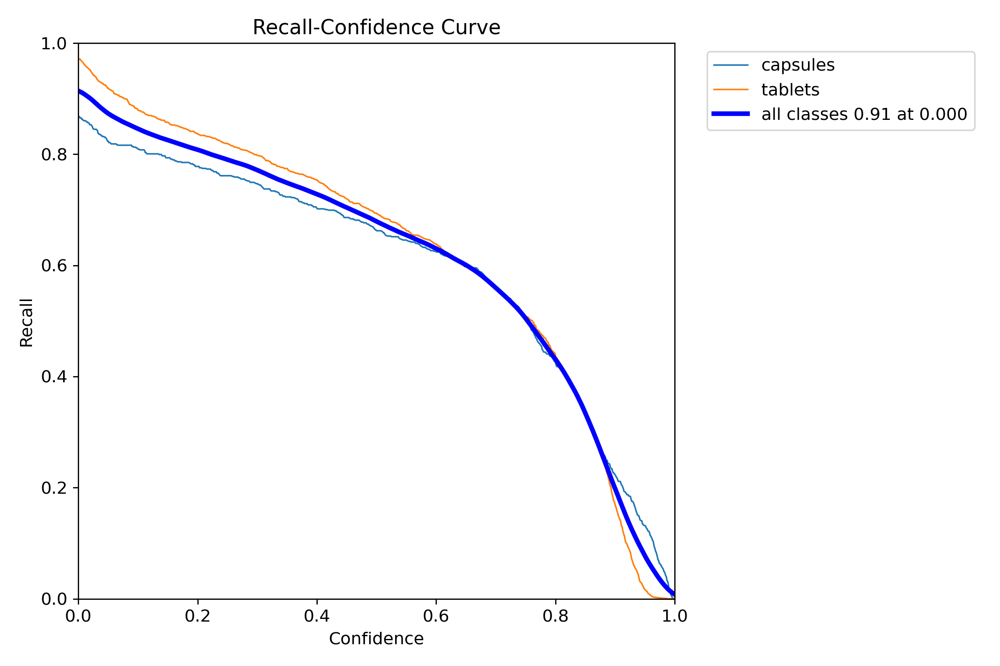

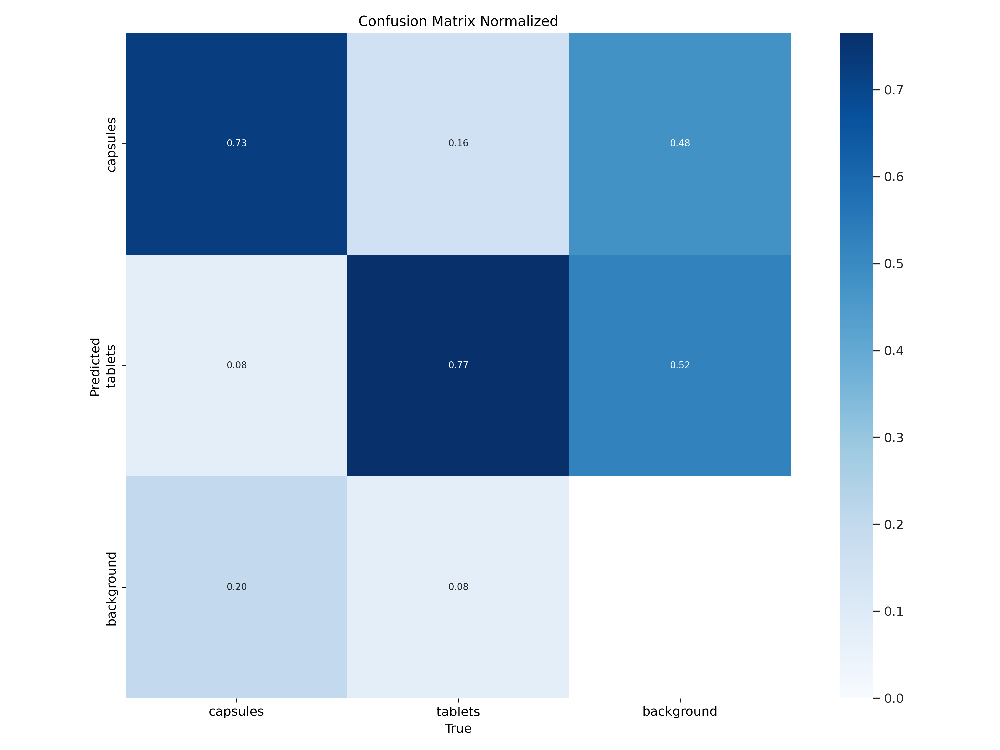

In [22]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/train/*.png'):
      display(Image(filename=image_path, width=800))
      print("\n")

# Detection

In [16]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.4 source={dataset.location}/test/images save=True

/content
Ultralytics YOLOv8.0.207 🚀 Python-3.10.12 torch-2.1.0+cu118 CPU (Intel Xeon 2.00GHz)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs

image 1/78 /content/datasets/Pills-Detection-21/test/images/1000_F_420127490_zYfufzLT1jVxPzLVJzIh46ZI6FSeML3B_jpg.rf.61a6d5e7eb4e0c570ac2c4d67e4330d3.jpg: 448x640 17 tabletss, 366.3ms
image 2/78 /content/datasets/Pills-Detection-21/test/images/1003948616_jpg.rf.c10a47e8d519d27f05096dfa4cf4d55b.jpg: 640x640 20 capsuless, 408.9ms
image 3/78 /content/datasets/Pills-Detection-21/test/images/1068691880_jpg.rf.a0d49d50df432143bb190131c071f207.jpg: 640x640 8 tabletss, 372.0ms
image 4/78 /content/datasets/Pills-Detection-21/test/images/107091458_jpg.rf.8843a60197a4b2cac4dfb248951ae1be.jpg: 320x640 10 capsuless, 124 tabletss, 196.0ms
image 5/78 /content/datasets/Pills-Detection-21/test/images/1113263349_jpg.rf.acf8b191bcb9636f482775f5463fc8fa.jpg: 640x384 1 capsules, 1 tablets, 229.0ms
image 6/78 /content/datasets/Pills-D

## Detected Results

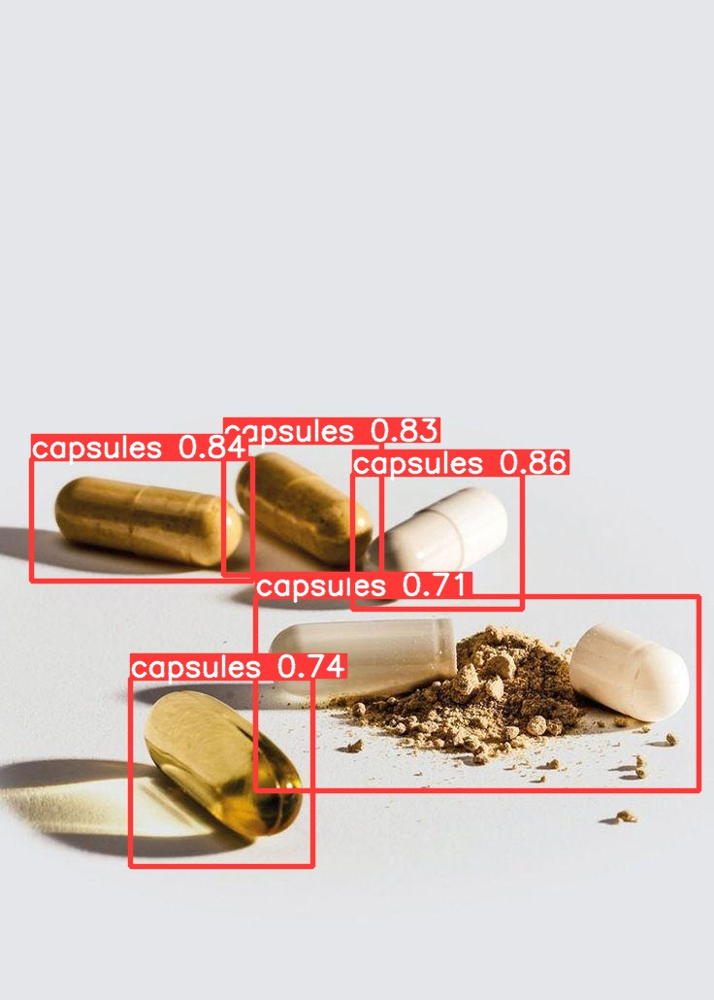

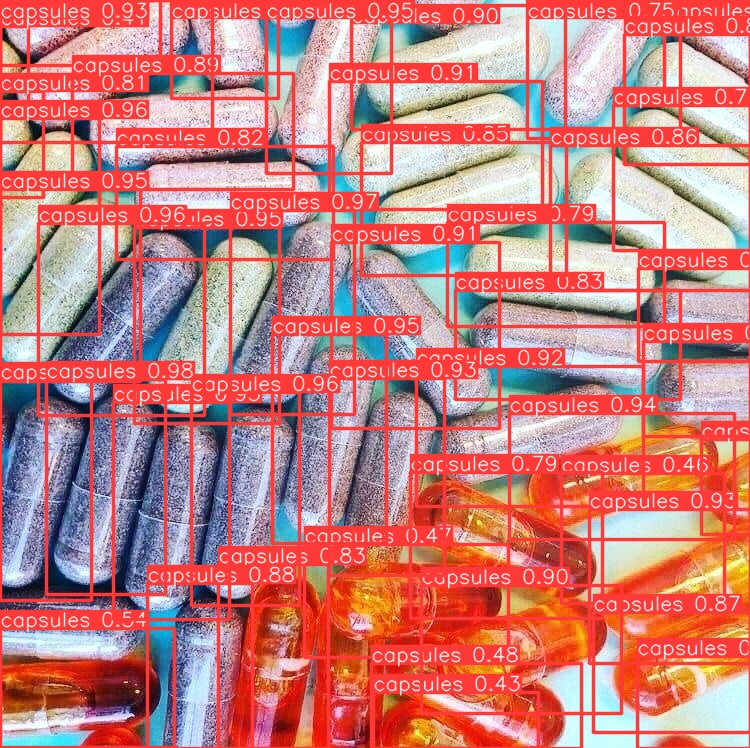

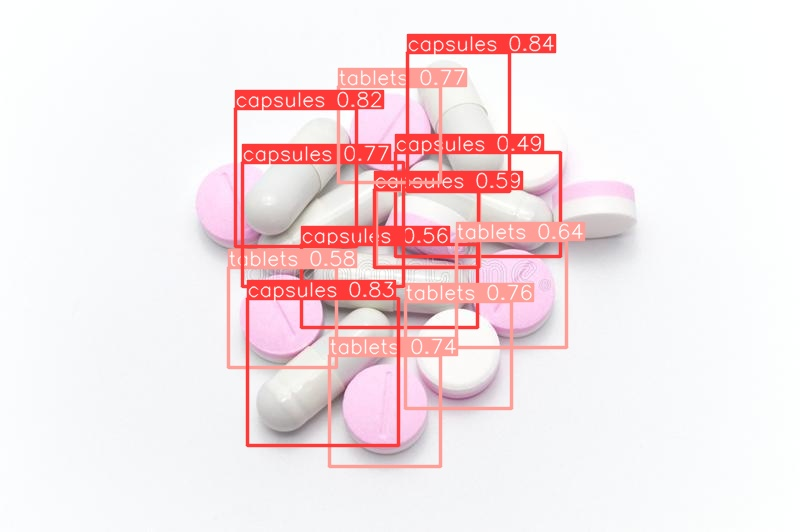

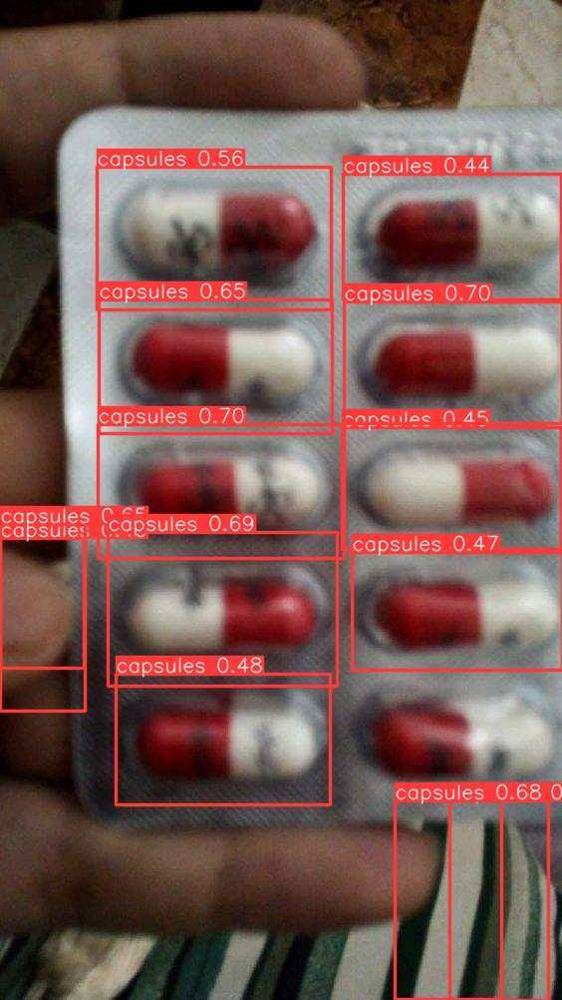

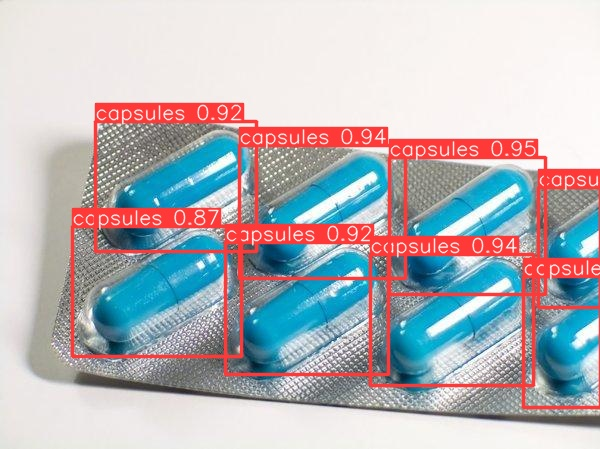

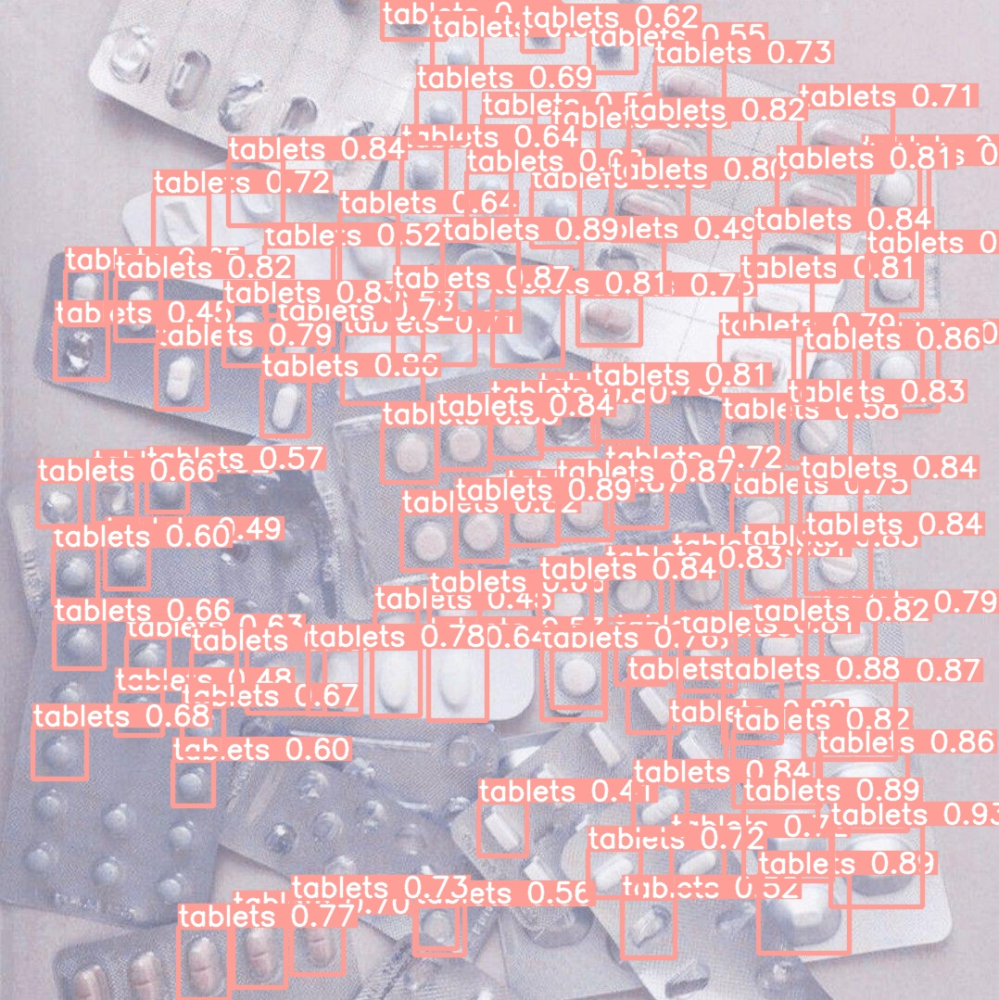

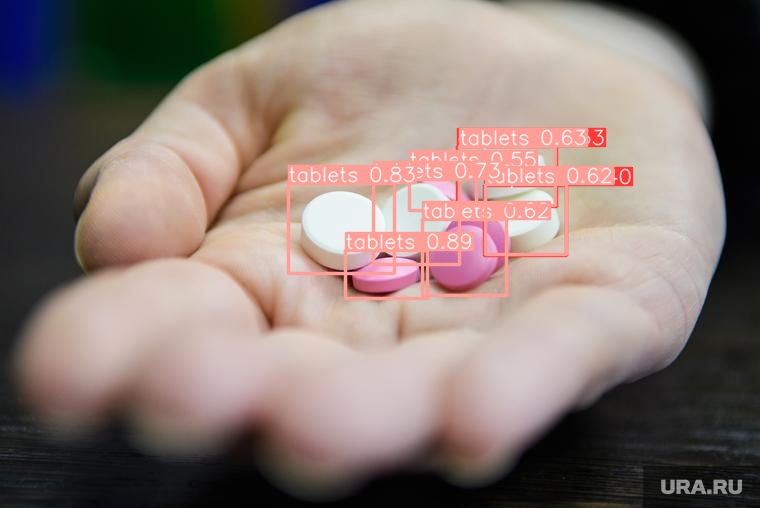

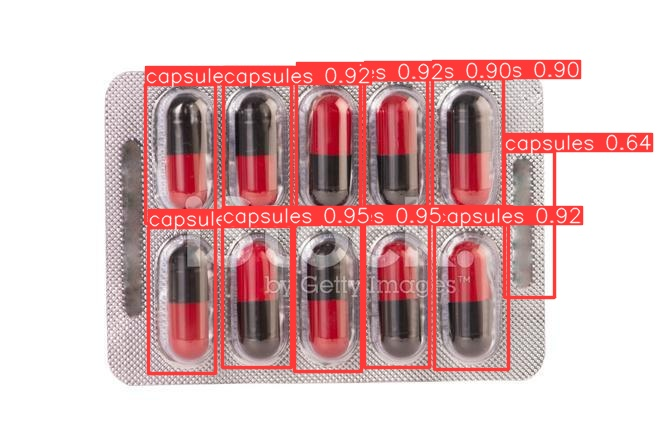

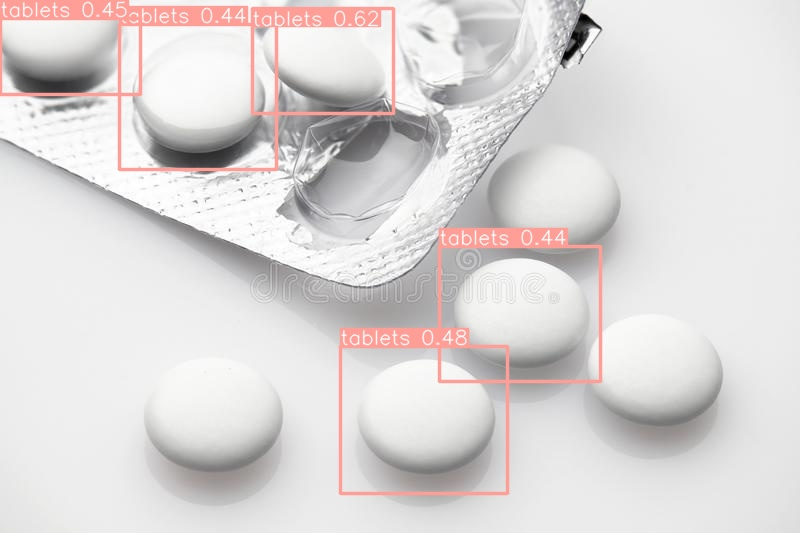

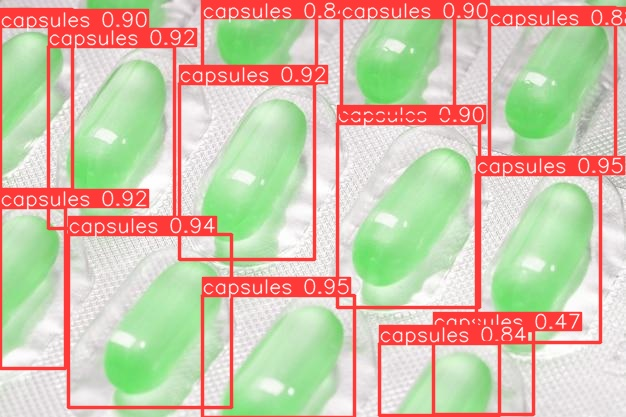

In [17]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict/*.jpg')[6:16]:
      display(Image(filename=image_path, width=800))
      print("\n")

# Monitor Logs with Tensorboard

In [41]:
%reload_ext tensorboard
%load_ext tensorboard
%tensorboard --logdir /content/runs/detect/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

# Load saved-weight


In [24]:
model = YOLO('yolov8s.yaml')
model = YOLO('/content/runs/detect/train/weights/best.pt')


                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256

# Training #2nd

## Train with Python

In [25]:
device

'cuda'

In [29]:
# Transform model to GPU
model.to(device)

# Use the model
model.train(data=dataset.location+'/data.yaml', epochs=100, imgsz=640, batch=8)  # train the model

engine/trainer: task=detect, mode=train, model=/content/runs/detect/train/weights/best.pt, data=/content/datasets/Pills-Detection-21/data.yaml, epochs=100, patience=50, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=cuda:0, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynamic=F

KeyboardInterrupt: ignored

In [34]:
!yolo task=detect mode=train resume model=/content/runs/detect/train4/weights/last.pt data={dataset.location}/data.yaml epochs=12 imgsz=640 plots=True

Ultralytics YOLOv8.0.207 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/runs/detect/train4/weights/last.pt, data=/content/datasets/Pills-Detection-21/data.yaml, epochs=100, patience=50, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=cuda:0, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=

## Result of 2nd training

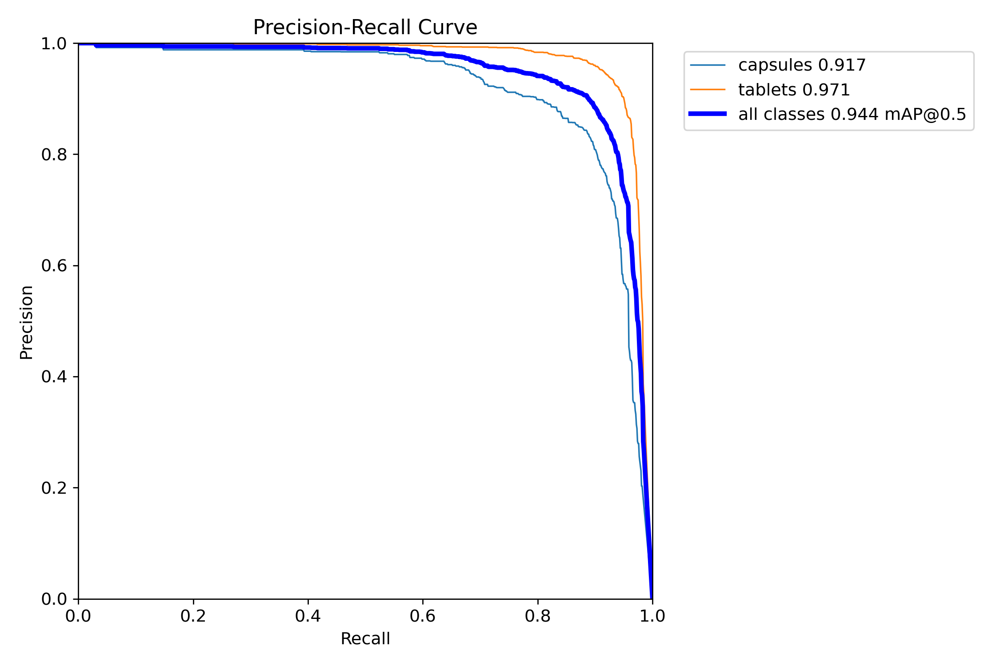

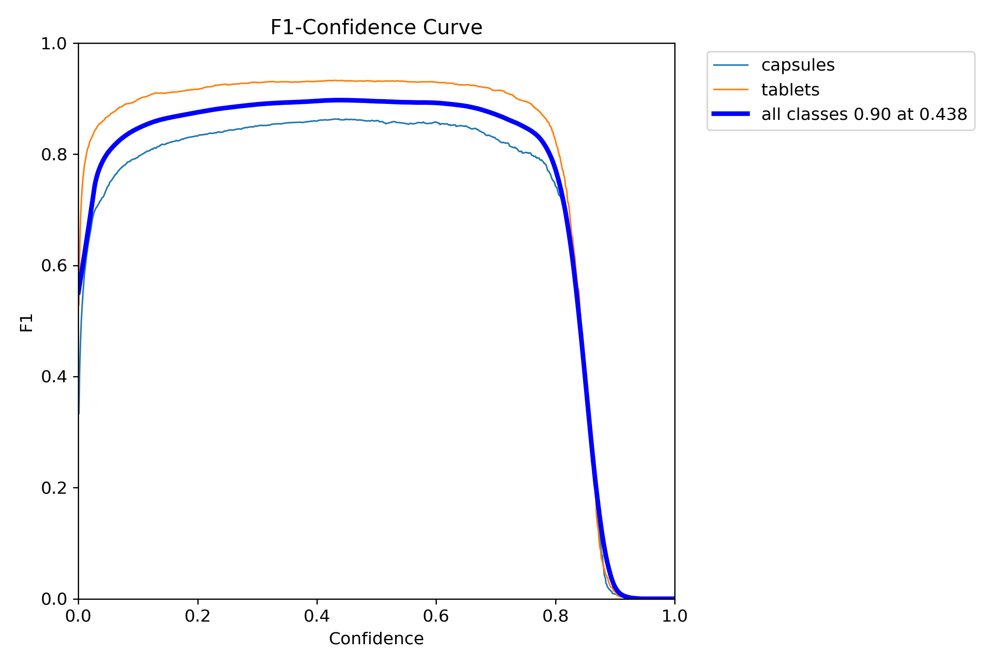

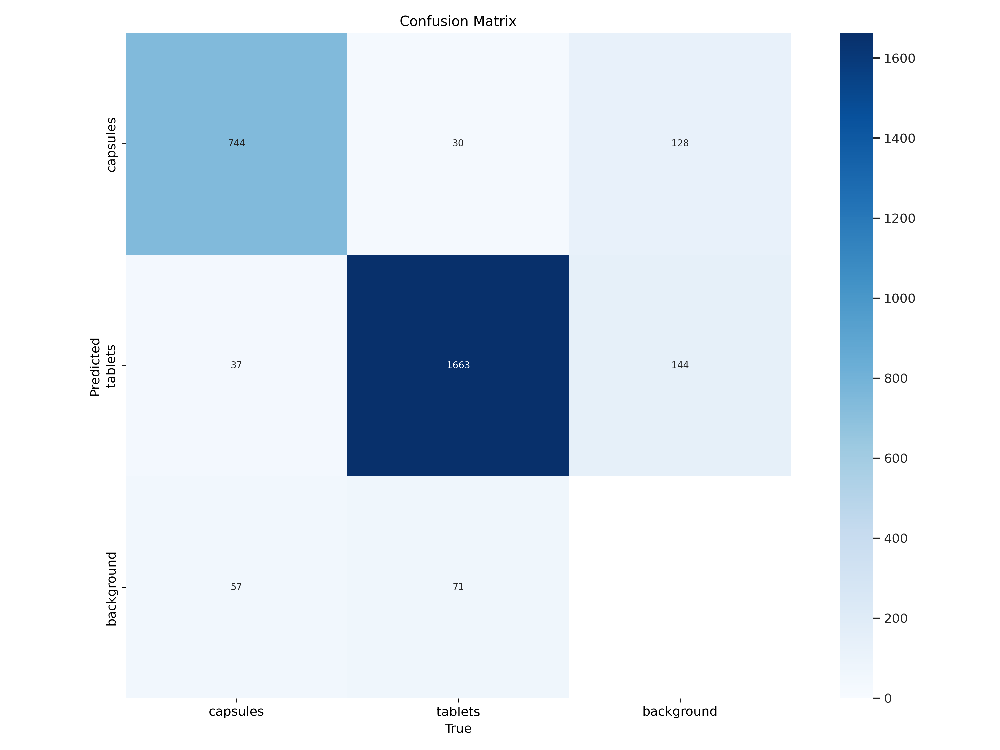

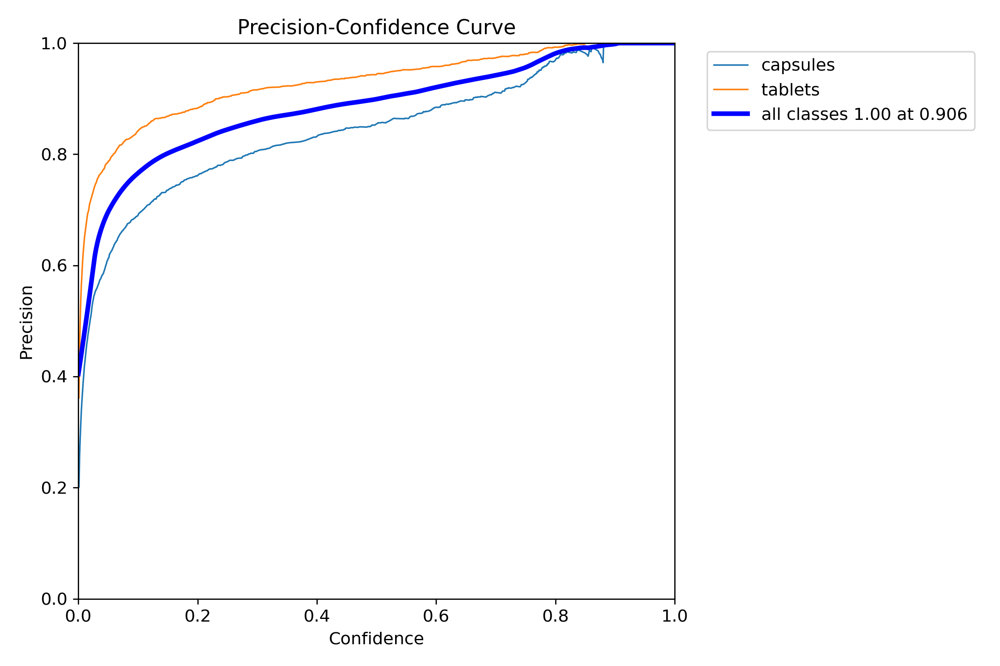

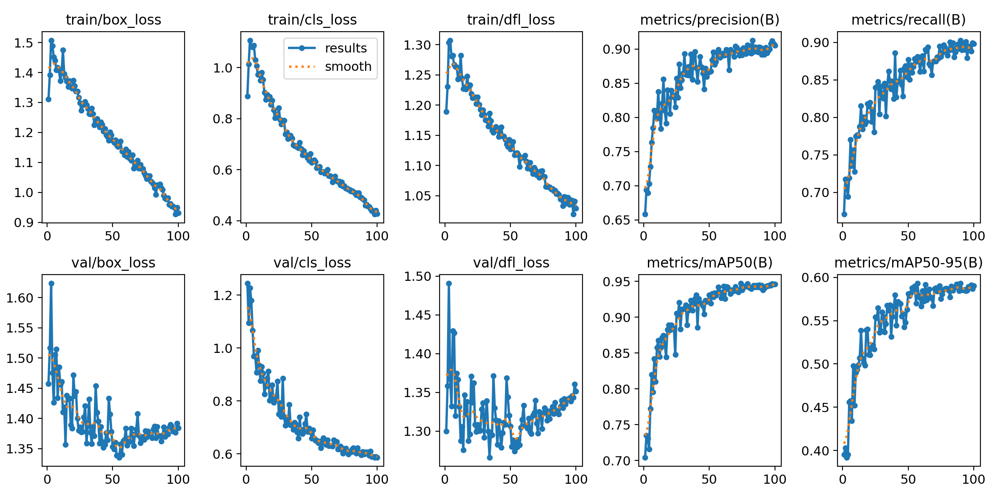

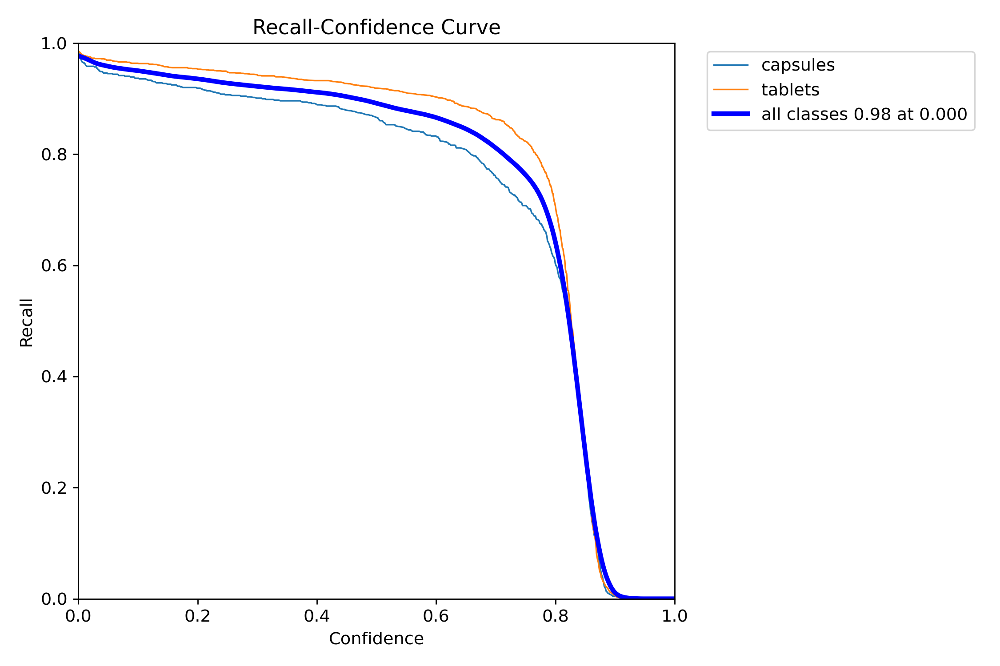

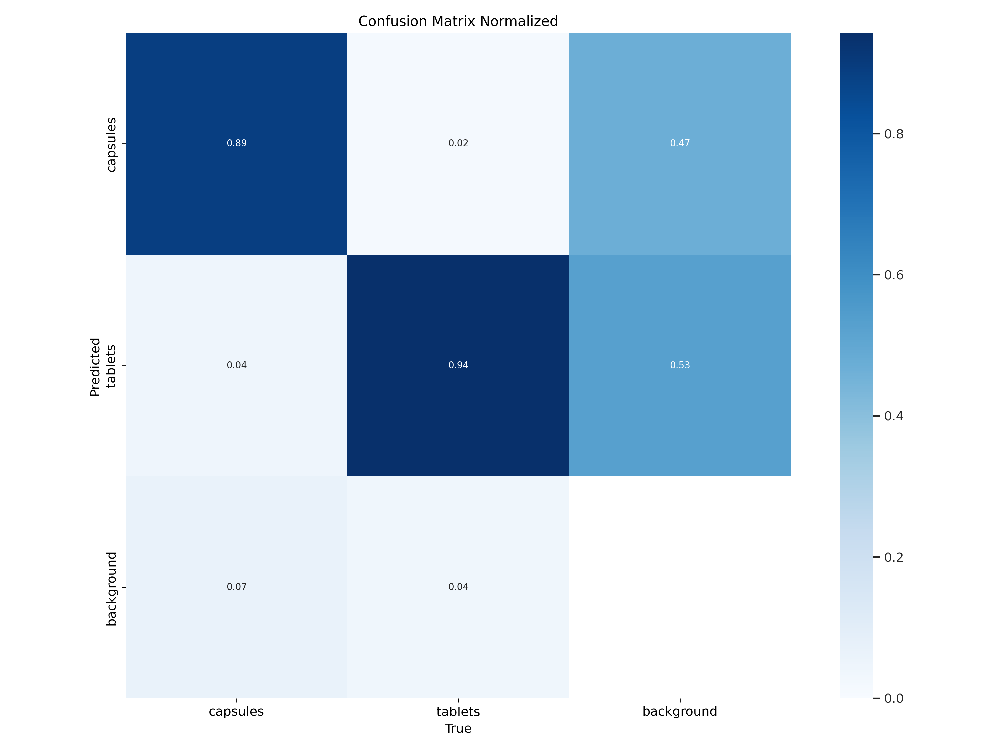

In [35]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/train4/*.png'):
      display(Image(filename=image_path, width=800))
      print("\n")

# Detection #2nd

In [36]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train4/weights/best.pt conf=0.4 source={dataset.location}/test/images save=True

/content
Ultralytics YOLOv8.0.207 🚀 Python-3.10.12 torch-2.1.0+cu118 CPU (Intel Xeon 2.00GHz)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs

image 1/78 /content/datasets/Pills-Detection-21/test/images/1000_F_420127490_zYfufzLT1jVxPzLVJzIh46ZI6FSeML3B_jpg.rf.61a6d5e7eb4e0c570ac2c4d67e4330d3.jpg: 448x640 16 tabletss, 347.0ms
image 2/78 /content/datasets/Pills-Detection-21/test/images/1003948616_jpg.rf.c10a47e8d519d27f05096dfa4cf4d55b.jpg: 640x640 18 capsuless, 411.6ms
image 3/78 /content/datasets/Pills-Detection-21/test/images/1068691880_jpg.rf.a0d49d50df432143bb190131c071f207.jpg: 640x640 8 tabletss, 398.9ms
image 4/78 /content/datasets/Pills-Detection-21/test/images/107091458_jpg.rf.8843a60197a4b2cac4dfb248951ae1be.jpg: 320x640 29 capsuless, 99 tabletss, 204.7ms
image 5/78 /content/datasets/Pills-Detection-21/test/images/1113263349_jpg.rf.acf8b191bcb9636f482775f5463fc8fa.jpg: 640x384 2 tabletss, 232.7ms
image 6/78 /content/datasets/Pills-Detection-21/

## Detected Results #2nd

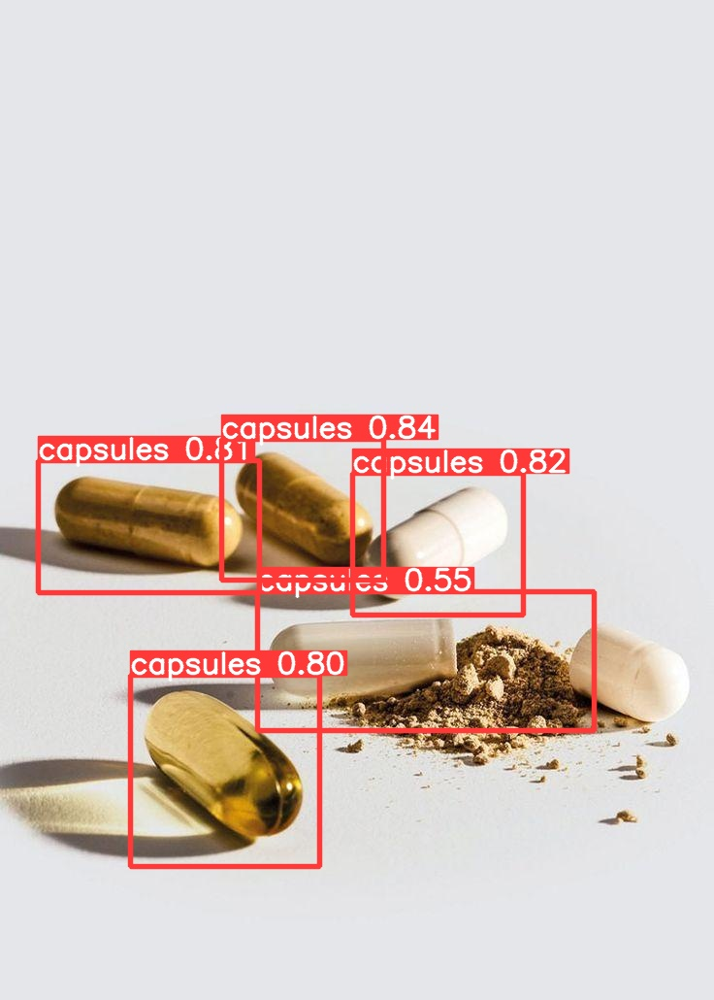

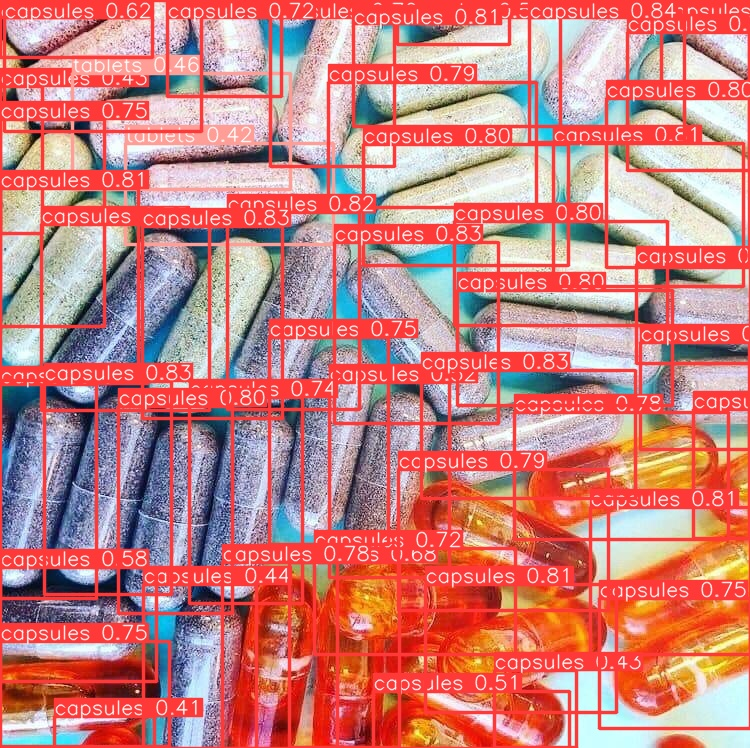

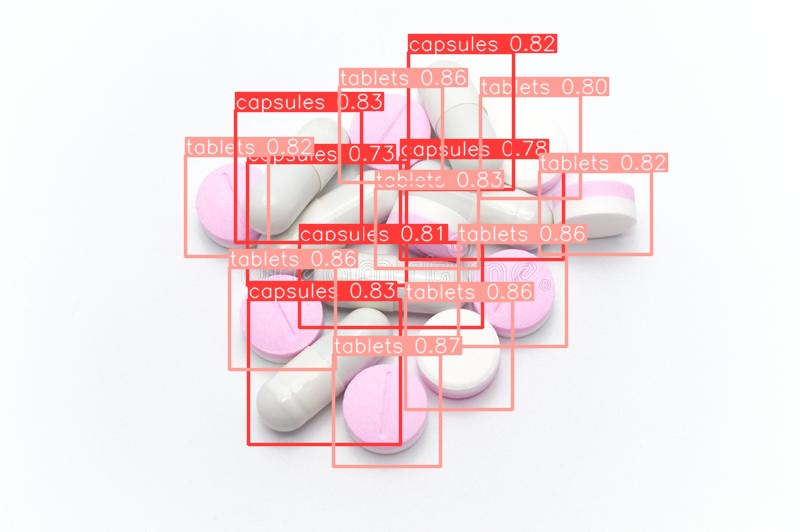

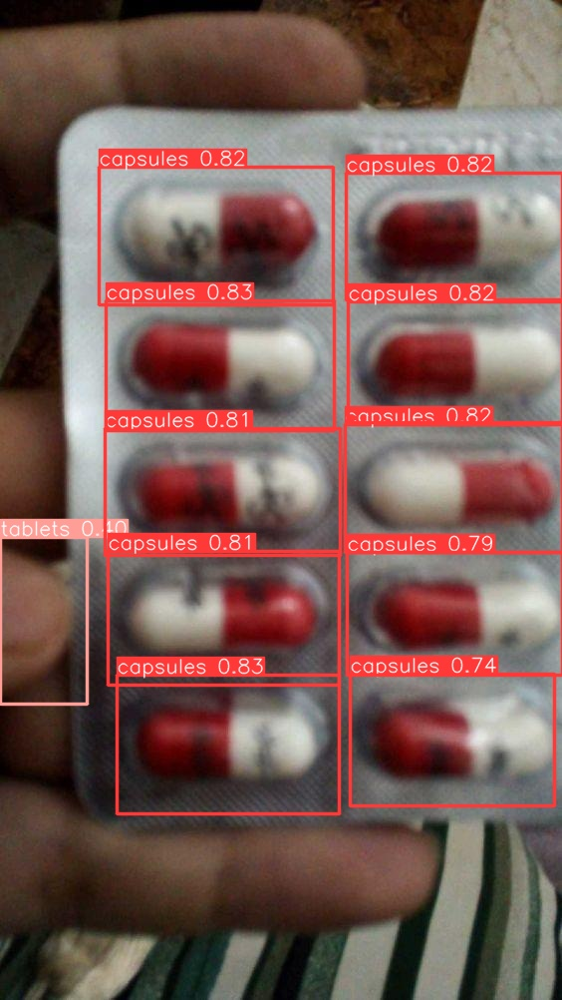

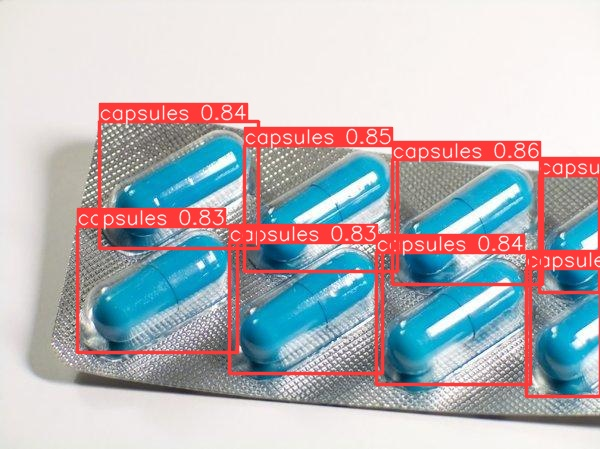

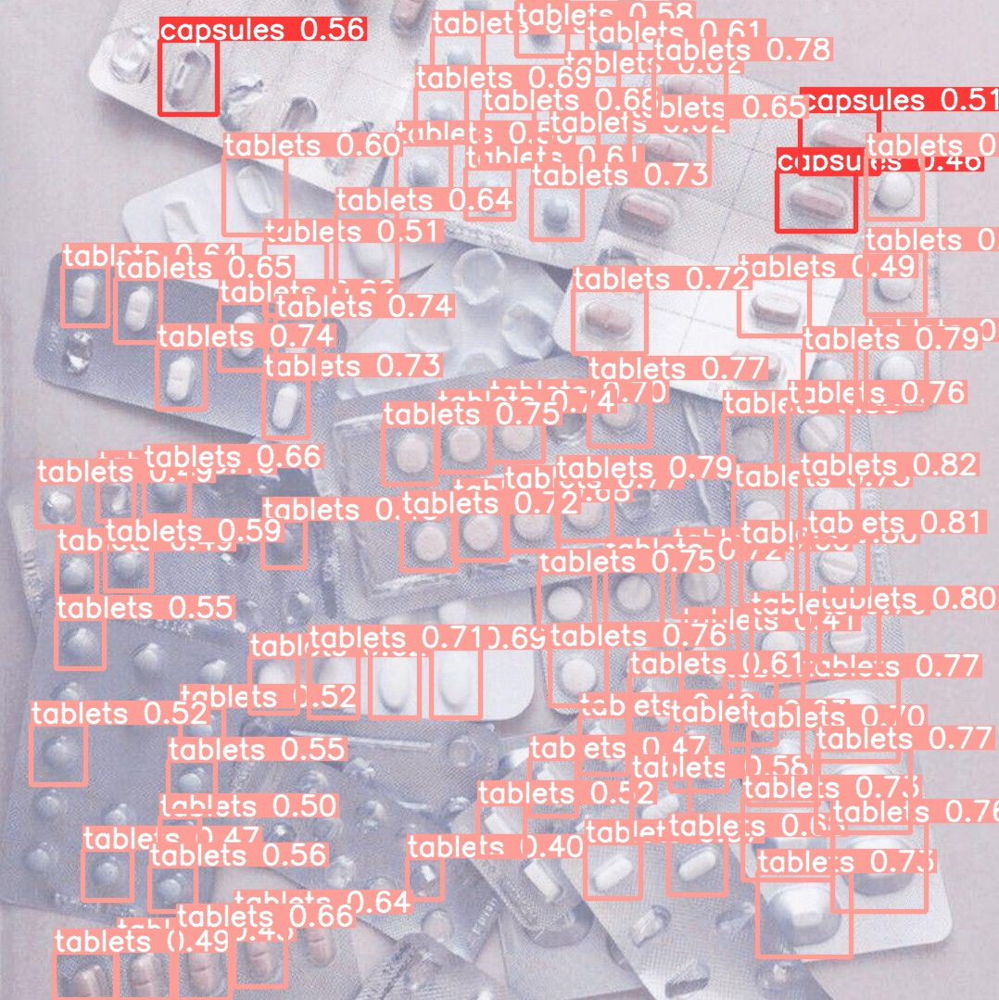

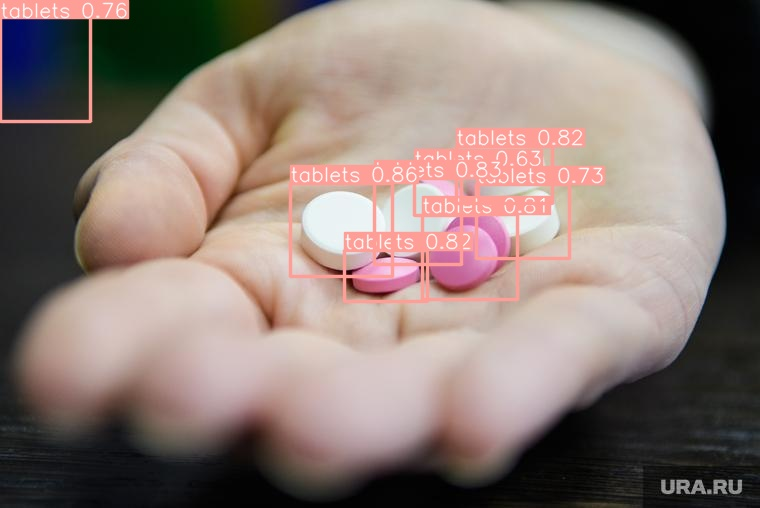

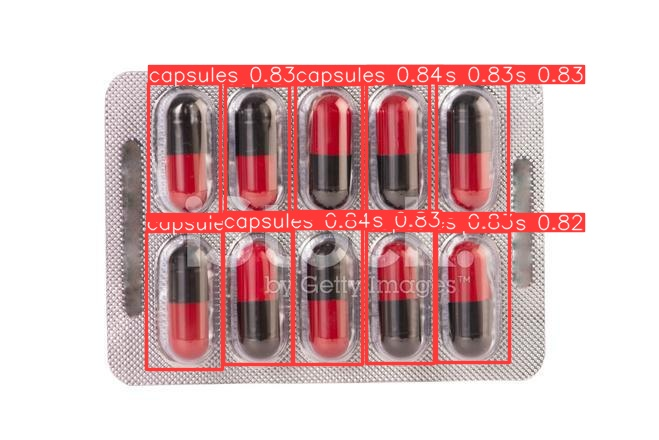

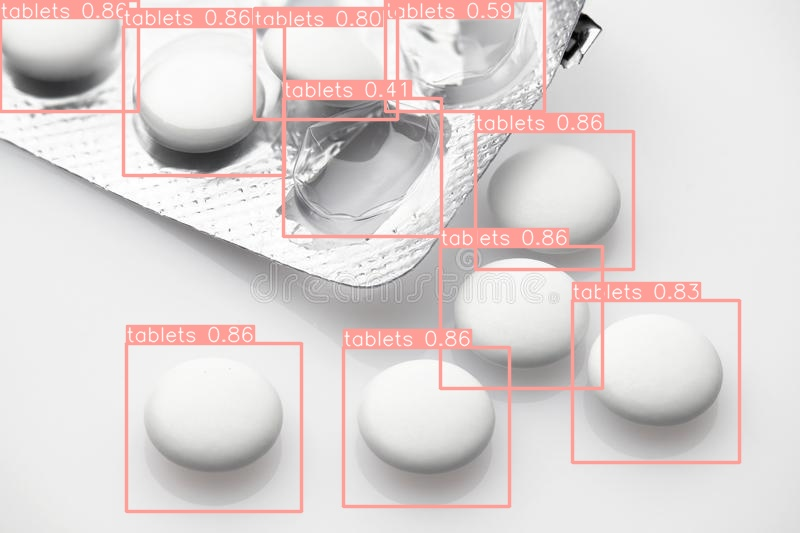

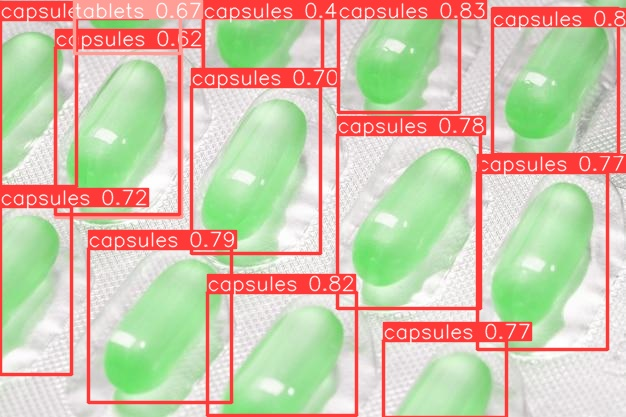

In [37]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict2/*.jpg')[6:16]:
      display(Image(filename=image_path, width=800))
      print("\n")

# Deploy

In [40]:
!pip install ultralytics==8.0.196

# cannot deploy becuase no authentication to deploy on this Roboflow Project Dataset
project.version(dataset.version).deploy(model_type="yolov8", model_path=f"{HOME}/runs/detect/train4/")

Dependency ultralytics==8.0.196 is required but found version=8.0.207, to fix: `pip install ultralytics==8.0.196`
Would you like to continue with the wrong version of ultralytics? y/n: y
An error occured when getting the model upload URL: 404 Client Error: Not Found for url: https://api.roboflow.com/seblful/pills-detection-s9ywn/21/uploadModel?api_key=nxl5o1thFPMhTHCXkPOe&modelType=yolov8&nocache=true
